<a href="https://colab.research.google.com/github/GulsahKLC/AB_Testing/blob/main/03_face_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face Recognition

Deepface is a lightweight face recognition and facial attribute analysis (age, gender, emotion and race) framework for python. It is a hybrid face recognition framework wrapping state-of-the-art models: VGG-Face, FaceNet, OpenFace, DeepFace, DeepID, ArcFace, Dlib, SFace and GhostFaceNet.

https://github.com/serengil/deepface



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# New Section

In [7]:
!pip install deepface

In [8]:
from deepface import DeepFace
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt

## Age Detection

In [10]:
img_path = "/content/drive/MyDrive/Colab Notebooks/faces_lecture/face11.png"


In [11]:
DeepFace.analyze(img_path = img_path, actions=['age'])

24-09-11 11:48:10 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5
100%|██████████| 539M/539M [00:02<00:00, 260MB/s]


[{'age': 25,
  'region': {'x': 280,
   'y': 410,
   'w': 1391,
   'h': 1391,
   'left_eye': (1230, 948),
   'right_eye': (692, 942)},
  'face_confidence': 0.91}]

In [12]:
result = DeepFace.analyze(img_path=img_path, actions=['age'])

In [13]:
def visualize_attribute(img_path, result, attribute = "age"):

    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if attribute in result[0]:

        prediction = result[0][attribute]

        text = f"{attribute}: {prediction}"
    else:
        text = f"{attribute} not found in result"

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1.5
    thickness = 2
    color = (255, 255, 255)
    shadow_color = (0, 0, 0)

    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(text)
    plt.show()

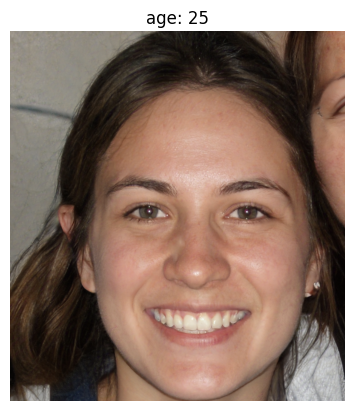

In [14]:
visualize_attribute(img_path, result, "age")

In [15]:
images_path = "/content/drive/MyDrive/Colab Notebooks/faces_lecture"


In [16]:

image_paths = [os.path.join(images_path, f) for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]



In [17]:
image_paths

['/content/drive/MyDrive/Colab Notebooks/faces_lecture/face11.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face12.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face13.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face14.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face15.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face16.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face17.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face18.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face19.png',
 '/content/drive/MyDrive/Colab Notebooks/faces_lecture/face20.png']

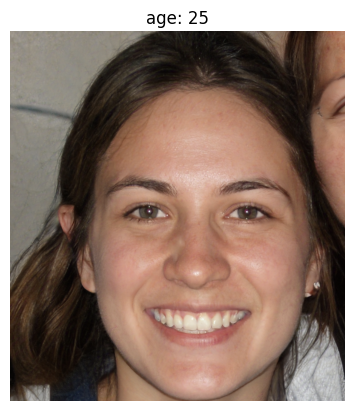

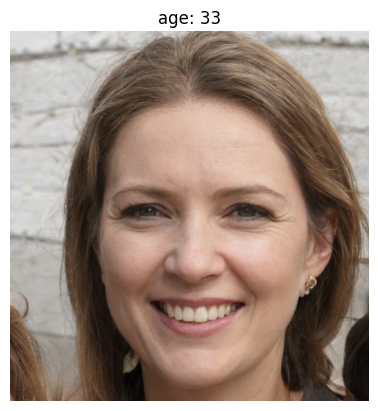

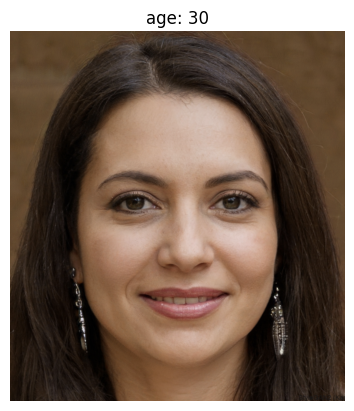

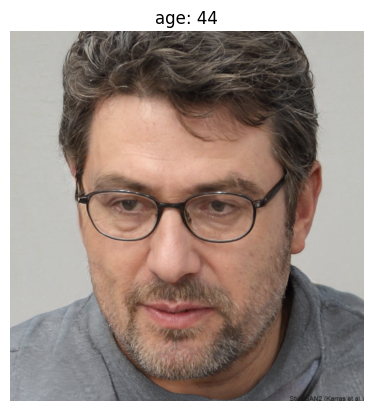

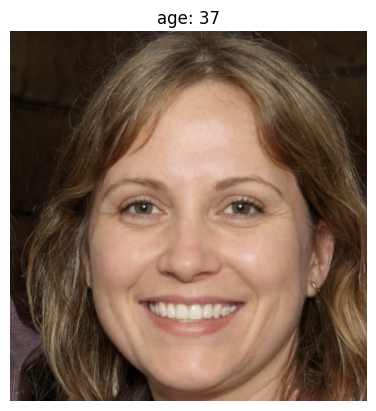

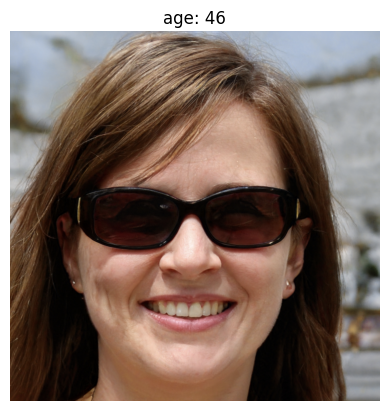

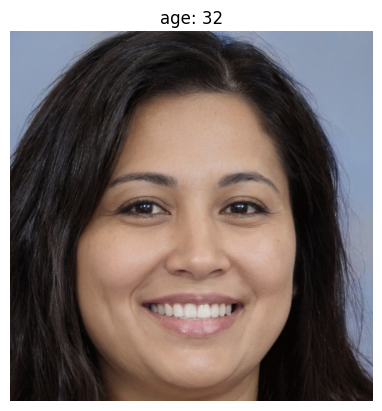

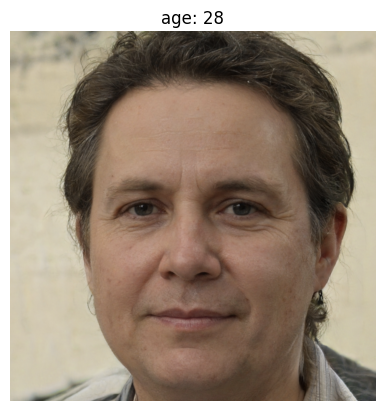

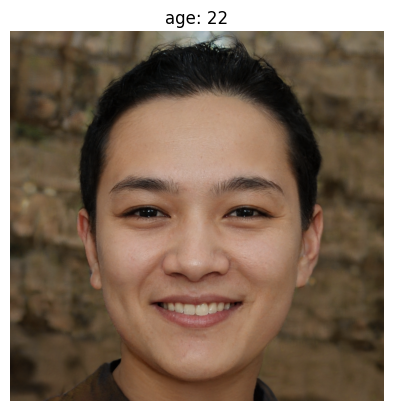

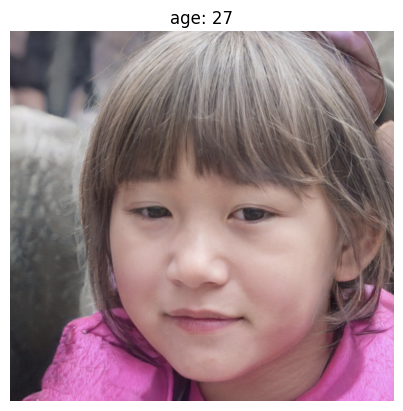

In [18]:
for path in image_paths:
    result = DeepFace.analyze(path, actions=['age'])
    visualize_attribute(path, result)



## Gender Detection

In [19]:
DeepFace.analyze(img_path=img_path, actions=['gender'])

24-09-11 11:51:16 - gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /root/.deepface/weights/gender_model_weights.h5
100%|██████████| 537M/537M [00:01<00:00, 271MB/s]


[{'gender': {'Woman': 47.429150342941284, 'Man': 52.57084369659424},
  'dominant_gender': 'Man',
  'region': {'x': 280,
   'y': 410,
   'w': 1391,
   'h': 1391,
   'left_eye': (1230, 948),
   'right_eye': (692, 942)},
  'face_confidence': 0.91}]

In [20]:
result = DeepFace.analyze(img_path=img_path, actions=['gender'])

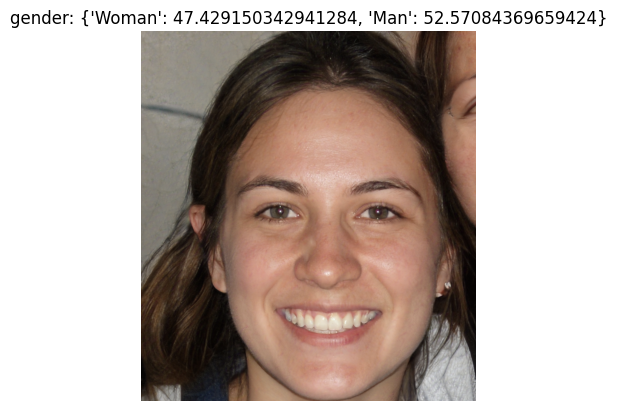

In [22]:
visualize_attribute(img_path, result, "gender")

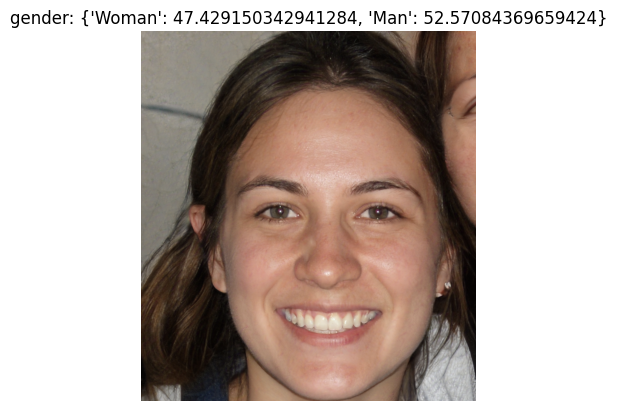

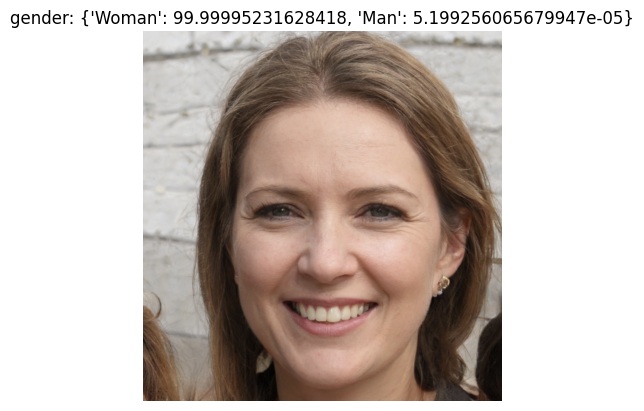

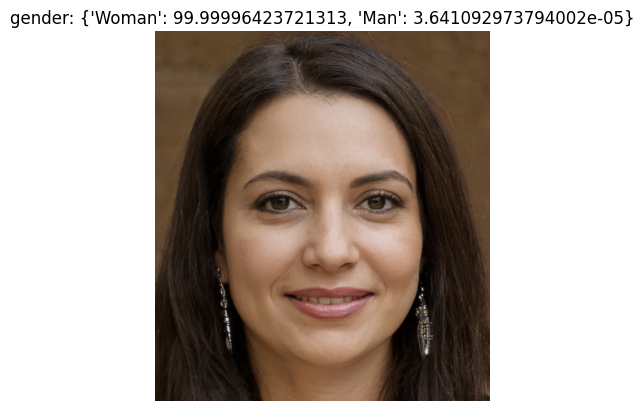

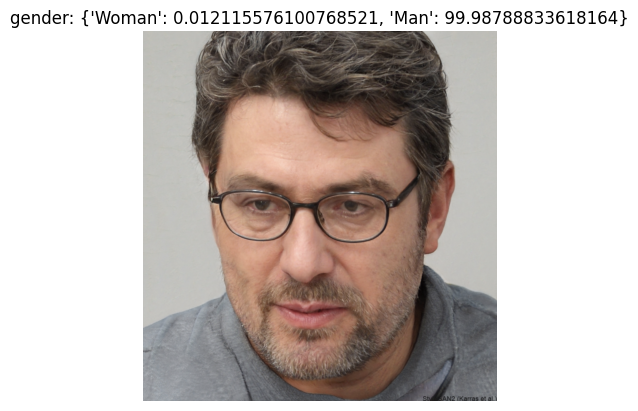

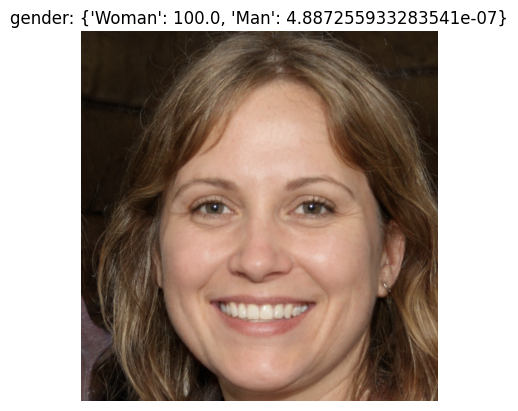

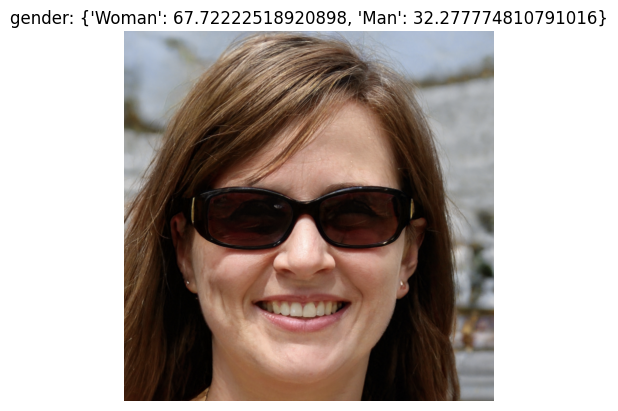

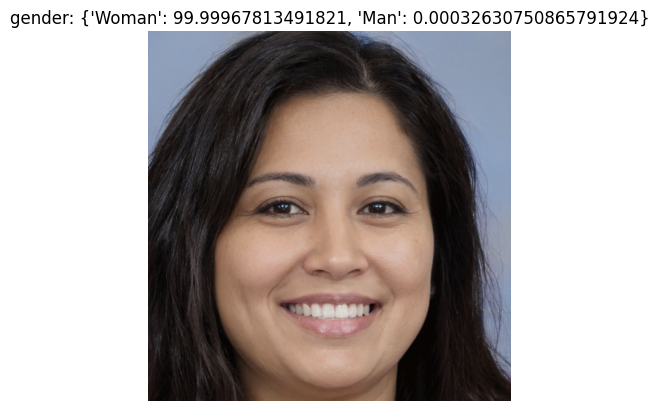

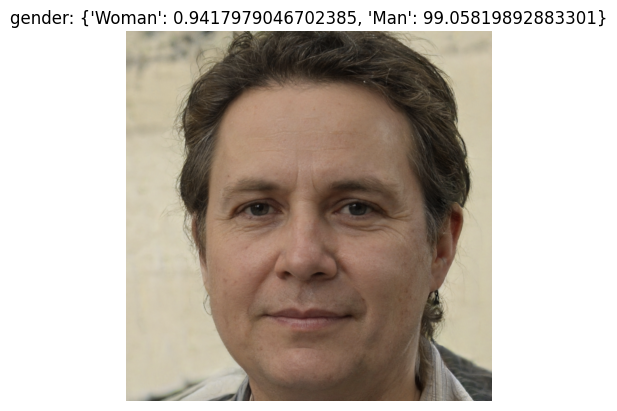

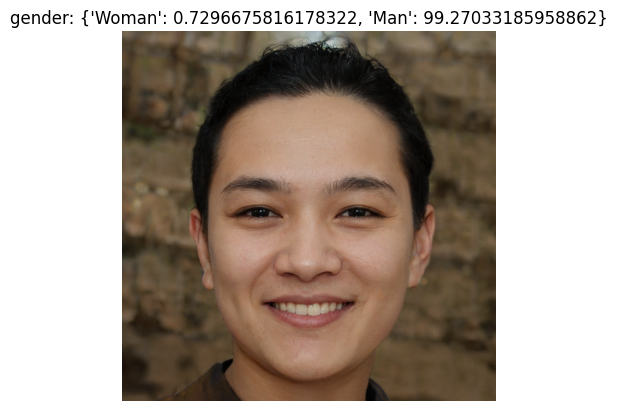

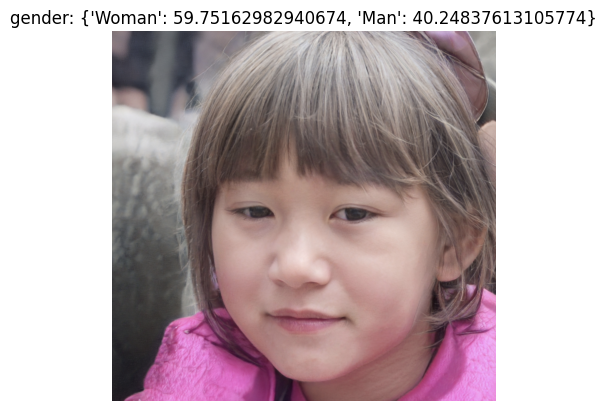

In [23]:
for path in image_paths:

    result = DeepFace.analyze(path, actions=['gender'])

    visualize_attribute(path, result, "gender")

## Race Detection

In [24]:
DeepFace.analyze(img_path=img_path, actions=['race'])

24-09-11 11:53:24 - race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: /root/.deepface/weights/race_model_single_batch.h5
100%|██████████| 537M/537M [00:02<00:00, 257MB/s]


[{'race': {'asian': 0.40119378827512264,
   'indian': 0.3684377996250987,
   'black': 0.055238616187125444,
   'white': 63.836413621902466,
   'middle eastern': 13.315315544605255,
   'latino hispanic': 22.023405134677887},
  'dominant_race': 'white',
  'region': {'x': 280,
   'y': 410,
   'w': 1391,
   'h': 1391,
   'left_eye': (1230, 948),
   'right_eye': (692, 942)},
  'face_confidence': 0.91}]

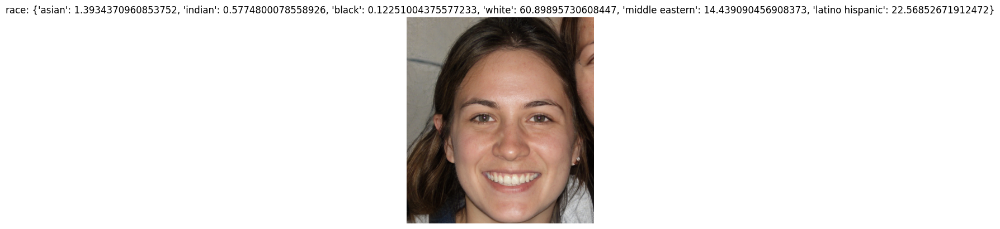

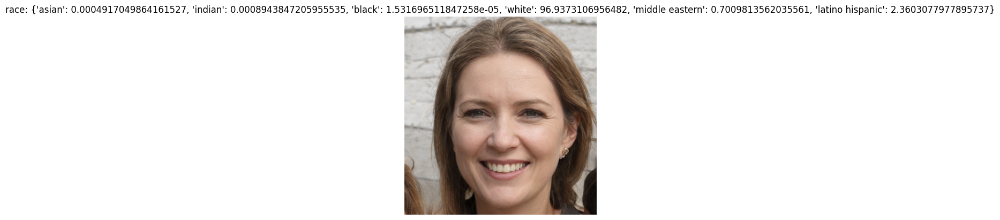

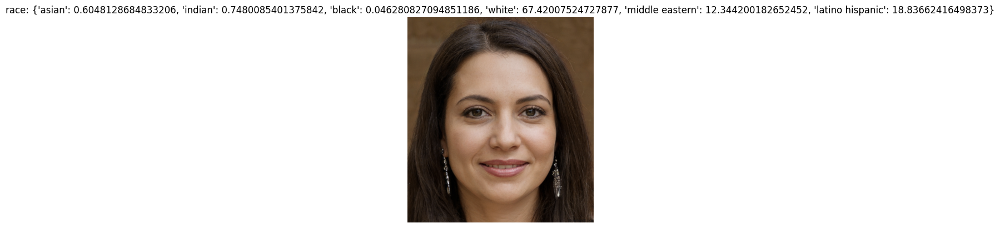

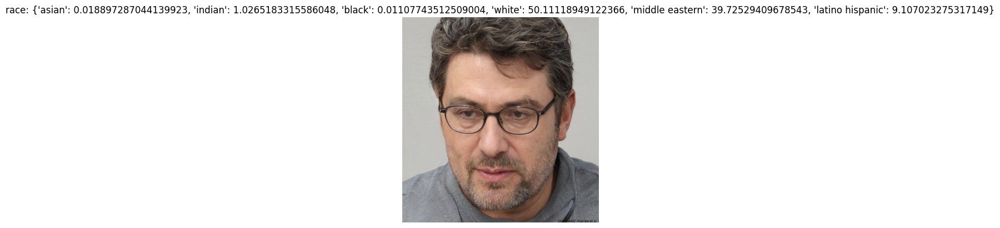

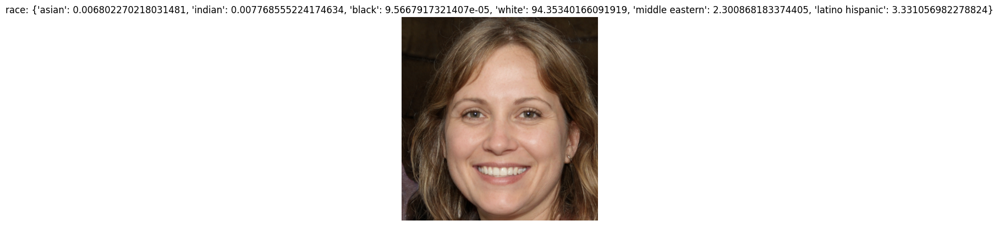

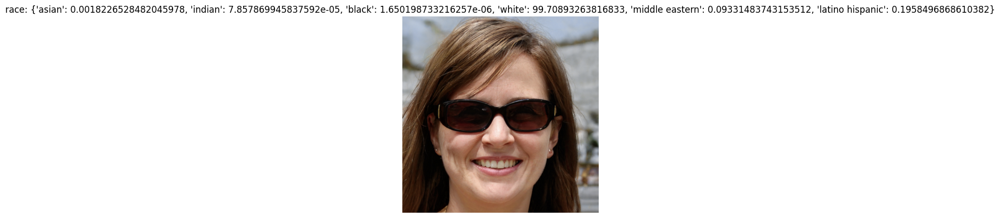

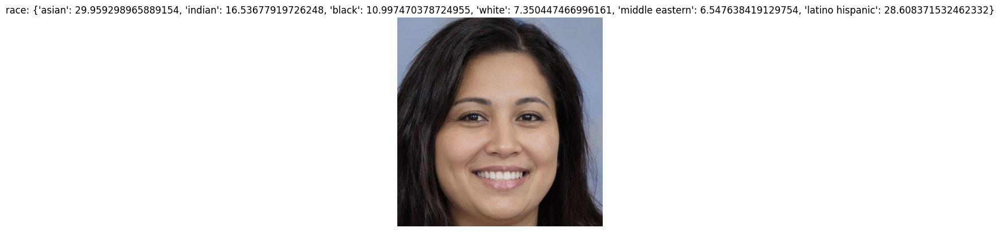

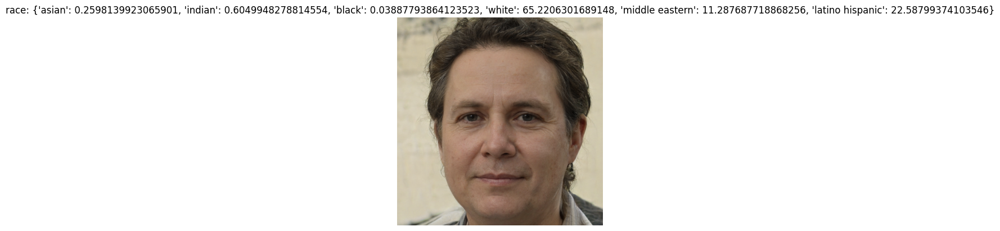

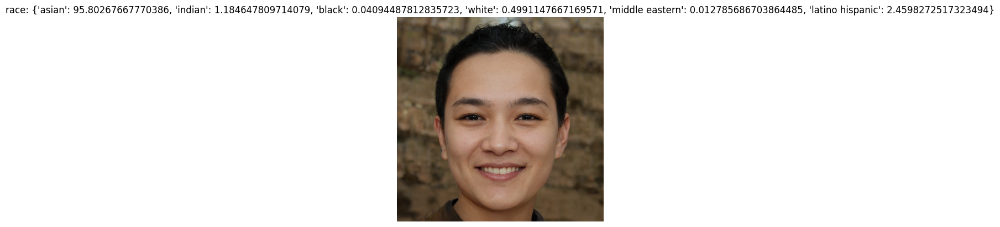

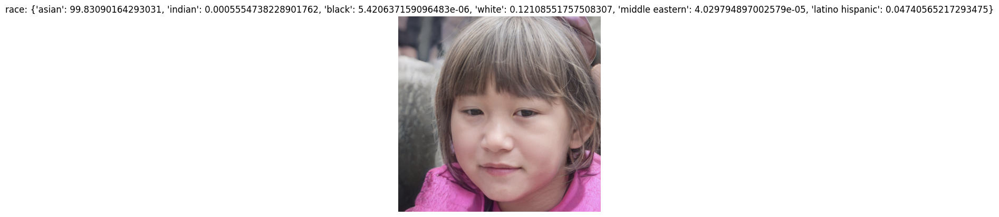

In [ ]:
for path in image_paths:
    result = DeepFace.analyze(path, actions=['race'])


    visualize_attribute(path, result, "race")

## Emotion Detection

In [25]:
DeepFace.analyze(img_path=img_path, actions=['emotion'])

24-09-11 11:53:35 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 88.7MB/s]


[{'emotion': {'angry': 4.7260036290510945e-05,
   'disgust': 4.2865483826208495e-07,
   'fear': 0.03461031179863968,
   'happy': 99.87572433045813,
   'sad': 0.004938805571019544,
   'surprise': 0.06448436574638,
   'neutral': 0.02018501304911294},
  'dominant_emotion': 'happy',
  'region': {'x': 280,
   'y': 410,
   'w': 1391,
   'h': 1391,
   'left_eye': (1230, 948),
   'right_eye': (692, 942)},
  'face_confidence': 0.91}]

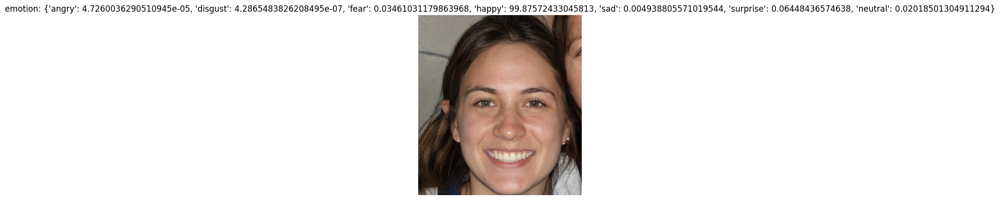

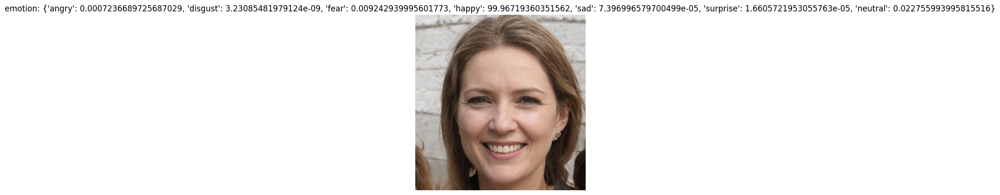

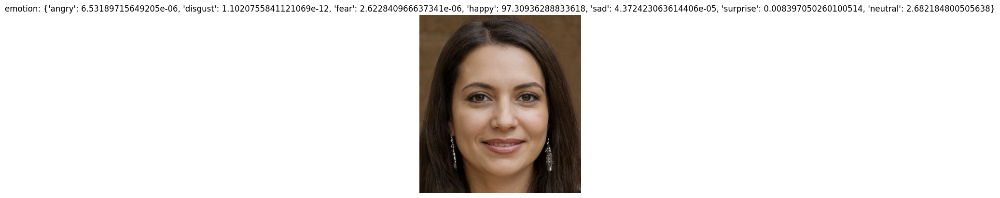

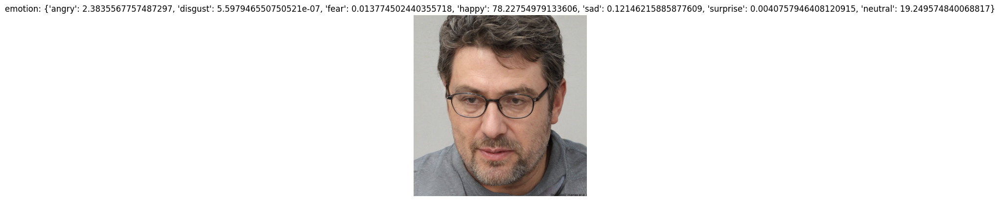

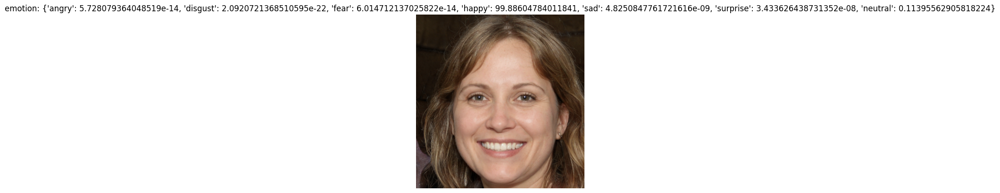

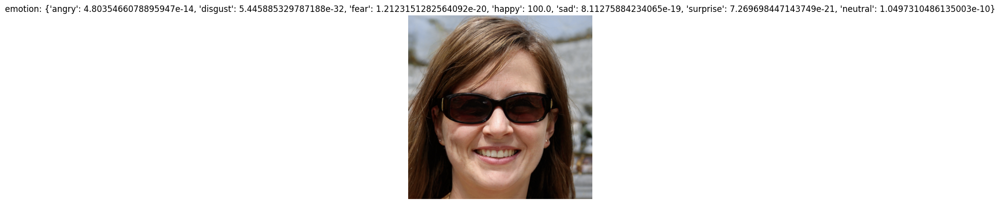

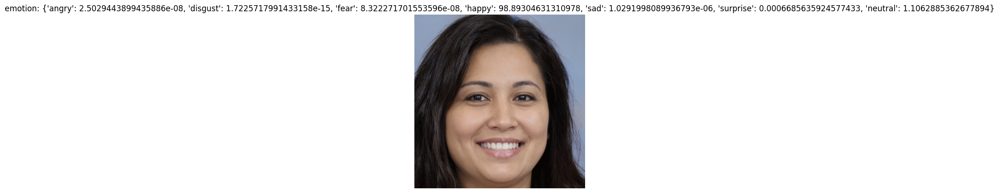

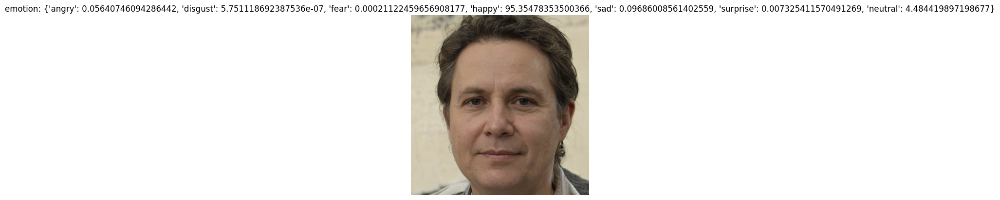

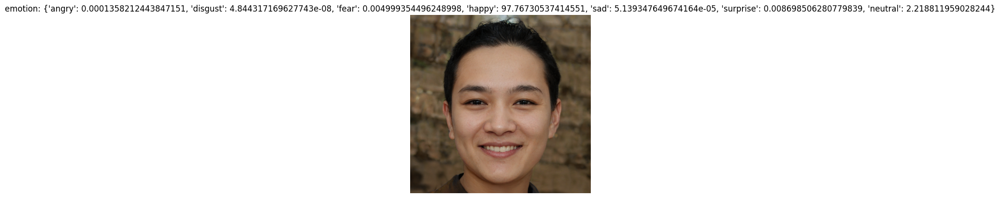

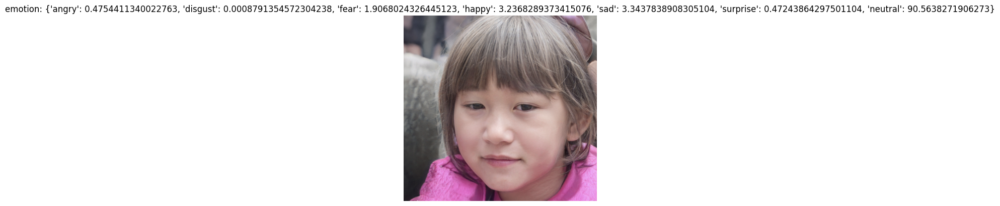

In [26]:
for path in image_paths:
    result = DeepFace.analyze(path, actions=['emotion'])
    visualize_attribute(path, result, "emotion")

In [27]:
DeepFace.analyze(img_path=img_path, actions=["age", "gender", "race", "emotion"])

Action: emotion: 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]


[{'age': 25,
  'region': {'x': 280,
   'y': 410,
   'w': 1391,
   'h': 1391,
   'left_eye': (1230, 948),
   'right_eye': (692, 942)},
  'face_confidence': 0.91,
  'gender': {'Woman': 47.429150342941284, 'Man': 52.57084369659424},
  'dominant_gender': 'Man',
  'race': {'asian': 0.40119378827512264,
   'indian': 0.3684377996250987,
   'black': 0.055238616187125444,
   'white': 63.836413621902466,
   'middle eastern': 13.315315544605255,
   'latino hispanic': 22.023405134677887},
  'dominant_race': 'white',
  'emotion': {'angry': 4.7260036290510945e-05,
   'disgust': 4.2865483826208495e-07,
   'fear': 0.03461031179863968,
   'happy': 99.87572433045813,
   'sad': 0.004938805571019544,
   'surprise': 0.06448436574638,
   'neutral': 0.02018501304911294},
  'dominant_emotion': 'happy'}]